**Important notes for 3 steps**



*   **Step 1 :**

1.   For training the models in easier way, we saved the face images with 2 methods. First save faces based on related dataset, Second save faces based on dataset and related image which used for extracting. the zip directories are in google drive

2.   The best model for faces image training called fact.pt is saved in /content/drive/MyDrive/DL_Phase1_models/face.pt directory

3.   This step takes about 1 hour.

*   **Step 2 :**

1.   In this part we generated augmented data from original faces. to have good new augmented data, we considered different transforms from original dataset. 4 different datasets generated from original ones. 

* first transform is about brightness and contrast. In this part we change the color range of the images. 

* Second transform is about positional transforms. in this part we used affine transform to change rotation, scale and translate of the images simultaneously.

* Third transform is about changing frequency spectrum of images. in this part we use gaussian filter as a low pass filter. 

* At last we mix all above transform and generate new images.

All the above generated images applied to pretrained models and used to train new models.


*   **Step 3 :**



1.   in this procedure we used best models from part 1 and part 2, the directory of best model in part2 is : /content/drive/MyDrive/DL_Phase1_models/Parvizi_Part2.pt

2.   final model is the best model in part3 is saved in /content/drive/MyDrive/DL_Phase1_models/final_model.pt

2.   This step takes about 2 hours.


**All links which are shared with you :**

DP_Phase1 : https://drive.google.com/file/d/1EaRpPpMO-U4f9QRTu2uFil6Z7C8Z3s8e/view?usp=sharing

DP_Phase1_1 : https://drive.google.com/file/d/1T2kWAp2yBjN6tGnnFHAdo0XABq-gmr5J/view?usp=sharing

face.pt : https://drive.google.com/file/d/1eWiiS8gWU3RwKvOA93d_OnmnVAlqowvt/view?usp=sharing

Parvizi_Part2.pt : https://drive.google.com/file/d/18Np6tniR9zeUZw-wCoor9um9FroXM72Z/view?usp=sharing

final_model.pt : https://drive.google.com/file/d/16fK-7dzB7MUkR8ETWzmkeManPEYujy0Y/view?usp=sharing







In [ ]:
!git clone https://github.com/XL2248/MSCTD.git

Cloning into 'MSCTD'...
remote: Enumerating objects: 1217, done.
remote: Counting objects: 100% (27/27), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 1217 (delta 13), reused 7 (delta 3), pack-reused 1190
Receiving objects: 100% (1217/1217), 102.24 MiB | 19.42 MiB/s, done.
Resolving deltas: 100% (616/616), done.
Updating files: 100% (934/934), done.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Read main data from drive

!unzip -q "/content/drive/MyDrive/Colab_Notebooks/Deep_Learning/deepproject/train_ende.zip"
!unzip -q "/content/drive/MyDrive/Colab_Notebooks/Deep_Learning/deepproject/test.zip"
!unzip -q "/content/drive/MyDrive/Colab_Notebooks/Deep_Learning/deepproject/dev.zip"


replace train_ende/0.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace train_ende/1.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
replace test/0.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
replace dev/0.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


In [ ]:
# Import libraries

import os
import matplotlib.pyplot as plt
import torch
from torchvision.transforms import ToTensor, Lambda, transforms
import torchvision.transforms as T
from torch.utils.data import Dataset, TensorDataset, DataLoader, ConcatDataset
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import torchvision
from torchvision import datasets, models, transforms
import cv2 as cv
import numpy as np
import cv2
import dlib
import time
from __future__ import print_function, division
import copy
import pathlib

from torchsummary import summary

import random
import glob
import re


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

print(device)

cuda:0


# DataLoader

In [ ]:
# english_dev : 5063
# english_test : 5067
# english_train : 20240
# #--------------------
# german_dev : 5063
# german_test : 5067
# german_train : 20240
# #-------------------

In [ ]:
y_h = lambda y : torch.zeros(3, dtype=torch.float).scatter_(dim=0, index=torch.tensor(y), value=1)
class MSCTDDataset(Dataset):
    
    def __init__(self, path_to_dataset = None, transform=None, target_transform=None):
        if path_to_dataset == 'path_to_dataset_train':
            Data = 'train'
            path_english_text = 'english_train'
            path_sentiment_text = 'sentiment_train'
            path_image = 'train_ende'
        elif path_to_dataset == 'path_to_dataset_test':
            Data = 'test'
            path_download = 'test_ende'
            path_english_text = 'english_test'
            path_sentiment_text = 'sentiment_test'
            path_image = 'test'
        elif path_to_dataset == 'path_to_dataset_dev':
            Data = 'dev'
            path_download = 'dev'
            path_english_text = 'english_dev'
            path_sentiment_text = 'sentiment_dev'
            path_image = 'dev'
        else:
            return TypeError, path_to_dataset + " is invalid"
        #!unzip "/content/drive/MyDrive/Colab_Notebooks/Deep_Learning/deepproject/train_ende.zip"
        english_text_path = f"/content/MSCTD/MSCTD_data/ende/{path_english_text}.txt"
        sentiment_path = f"/content/MSCTD/MSCTD_data/ende/{path_sentiment_text}.txt"
        self.image_path = f"/content/{path_image}/"

        with open(english_text_path) as f:
          english_text = [line.strip() for line in f.readlines()]
        print(f"{Data} english_text", len(english_text))
        self.englishtext = english_text

        with open(sentiment_path) as f:
          sentiment = [line.strip() for line in f.readlines()]
        self.sentiment = sentiment
        print(f"{Data} sentiment", len(sentiment))
        
        Images = os.listdir(self.image_path)
        Images.sort(key = lambda x:  int(x.split(".")[0]))
        self.Images = Images
        # self.target = target
        # self.features = features
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.sentiment)

    def __getitem__(self, idx):

        img_path = os.path.join(self.image_path, self.Images[idx])

        img = cv.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)   # Chnage channel due to imread function read images in BGR coding.
        sntmnt = self.sentiment[idx]
        englsh_txt = self.englishtext[idx]

        if self.target_transform:
            label = y_h(sntmnt)
        if self.transform:
            img = cv2.resize(img,(64,64))
            img = transforms.Compose([transforms.ToTensor(),transforms.Resize(64)])(img)
            sntmnt = int(sntmnt)
        return img, englsh_txt, sntmnt 

In [ ]:
train = MSCTDDataset('path_to_dataset_train', target_transform = False)
test = MSCTDDataset('path_to_dataset_test', target_transform = False)
dev = MSCTDDataset('path_to_dataset_dev', target_transform = False)

train english_text 20240
train sentiment 20240
test english_text 5067
test sentiment 5067
dev english_text 5063
dev sentiment 5063


In [ ]:
image, en_text, sentiment = train[0]

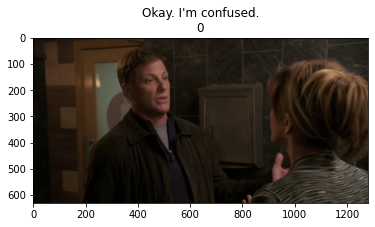

In [ ]:
plt.title(en_text+"\n" + sentiment)
plt.imshow(image)

# Step1

## Step 1_1_1 : Implementation of FaceNet

In [ ]:
!pip install facenet-pytorch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from facenet_pytorch import MTCNN

# facenet pytorch library to extract daces

#device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('Running on device: {}'.format(device))
mtcnn = MTCNN(keep_all=True, device=device)
def faceDetector(image, width, display):
    boxes, _ = mtcnn.detect(image)
    image_copy = image.copy()
    if type(boxes)== np.ndarray and display:
        for box in boxes:
            l = box.tolist()
            x1 = int(l[0])
            y1 = int(l[1])
            x2 = int(l[2])
            y2 = int(l[3])

            cv2.rectangle(image_copy, pt1=(x1, y1), pt2=(x2, y2), color=(0, 255, 0), thickness=width//200) 
    if display:

        plt.figure(figsize=[15,15])
        plt.subplot(121);
        plt.imshow(image);
        plt.title("Original Image");
        plt.axis('off');
        plt.subplot(122);
        plt.imshow(image_copy);
        plt.title("Output");
        plt.axis('off');

    else :
        return image_copy, boxes





Running on device: cuda:0


<ipython-input-16-ebb8713841af>:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=[15,15])


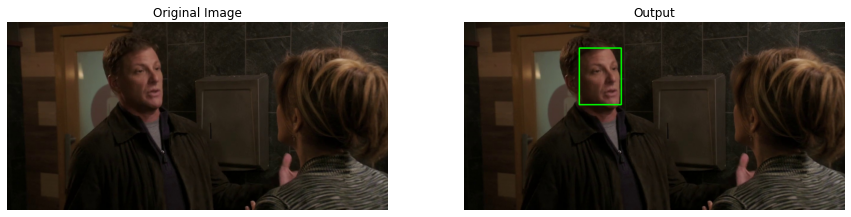

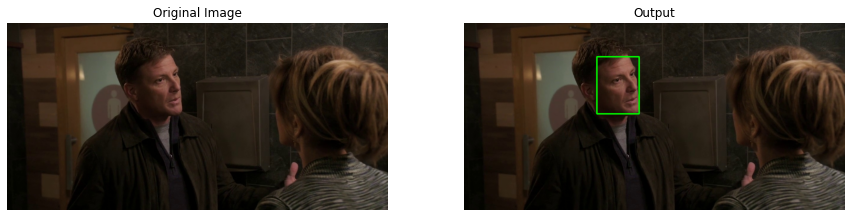

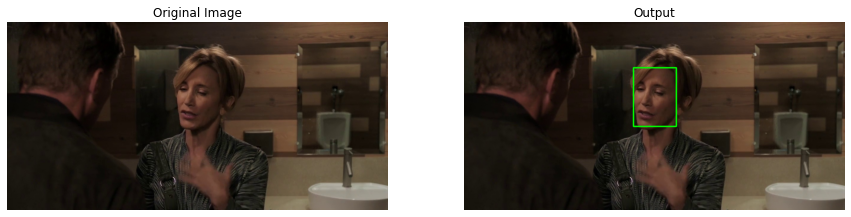

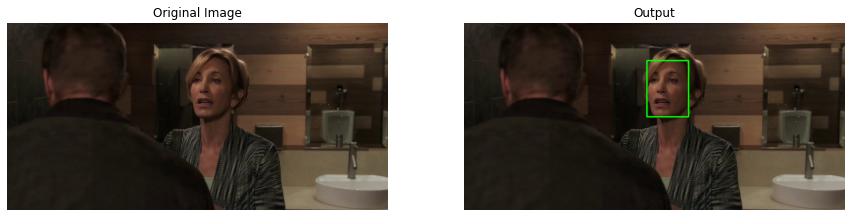

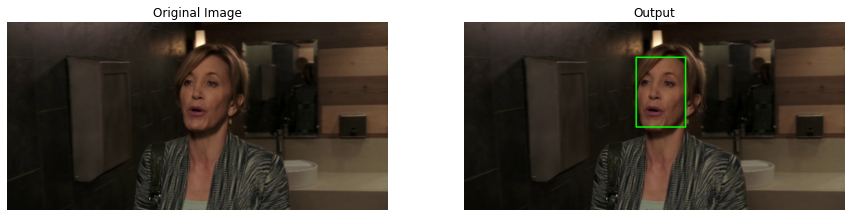

...

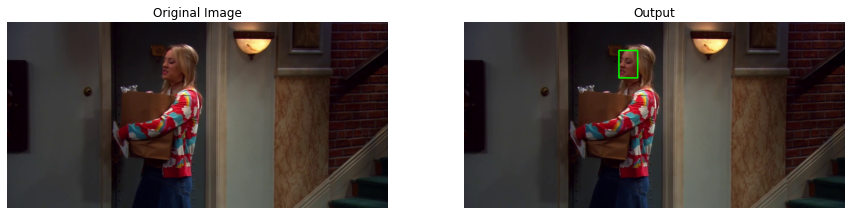

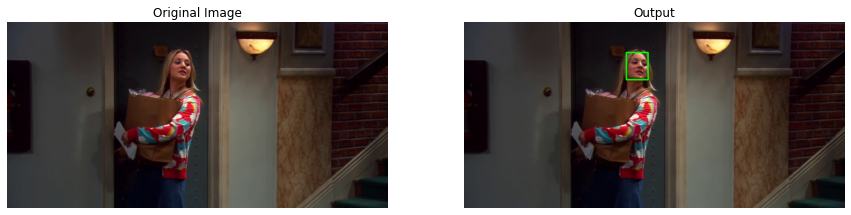

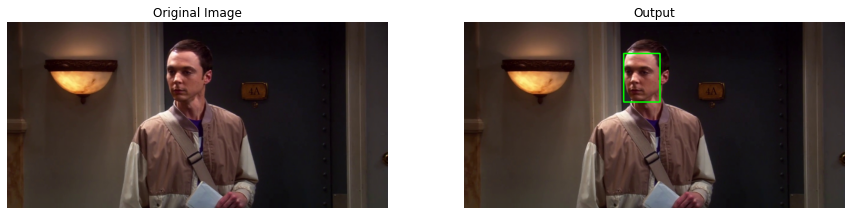

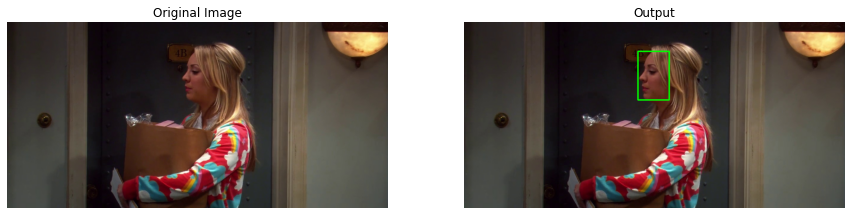

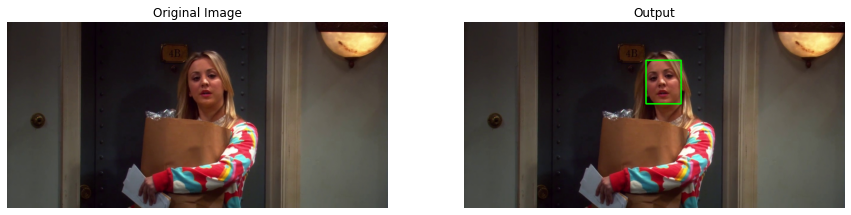

In [ ]:
# Test 40 train images with FaceNet model
for i in range(40):
    image = train[i][0]
    height = np.shape(image)[0]
    width = np.shape(image)[0]
    faceDetector(image, width=width, display=True)

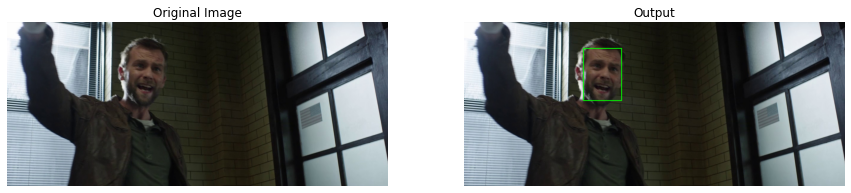

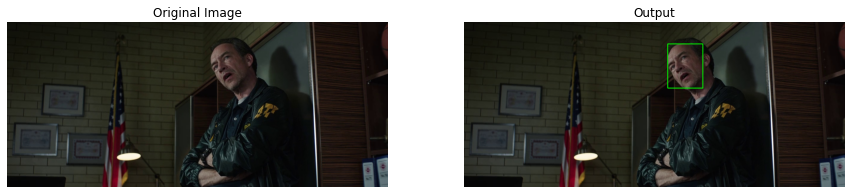

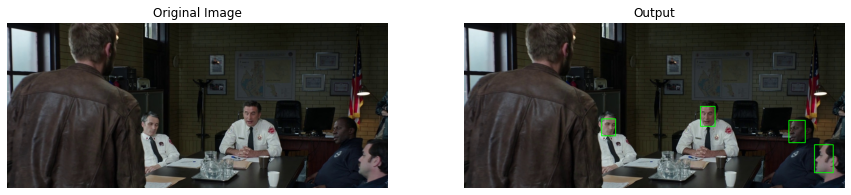

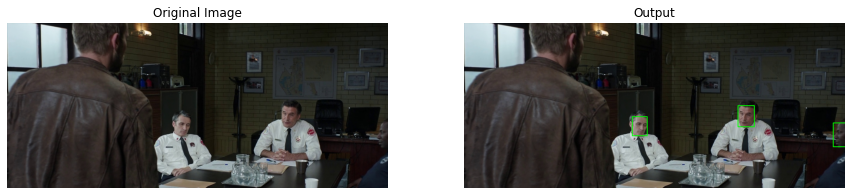

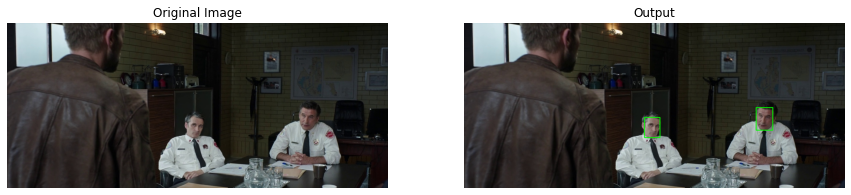

...

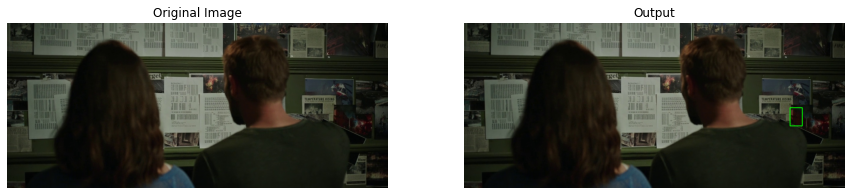

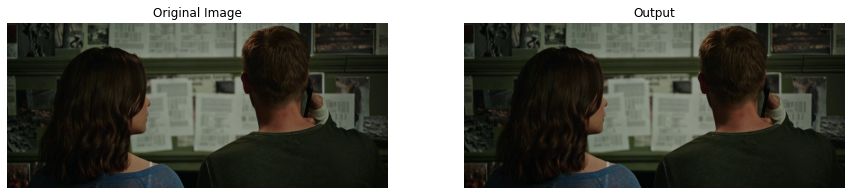

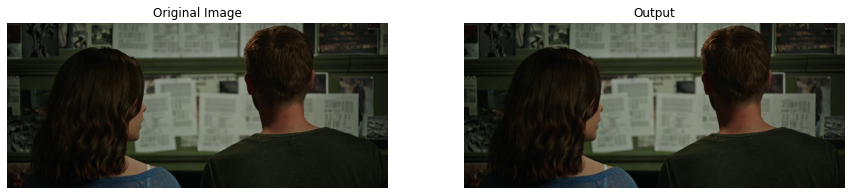

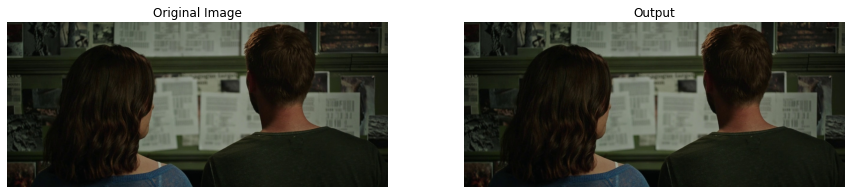

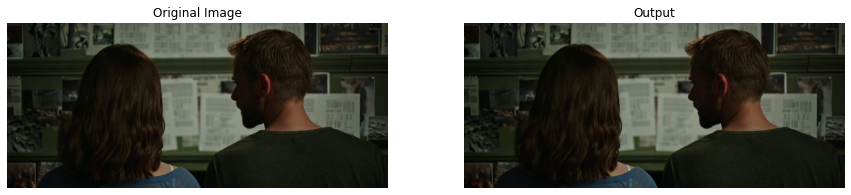

In [ ]:
# Test 20 test images with FaceNet model
for i in range(20):
    image = test[i][0]
    height = np.shape(image)[0]
    width = np.shape(image)[0]
    faceDetector(image, width=width, display=True)

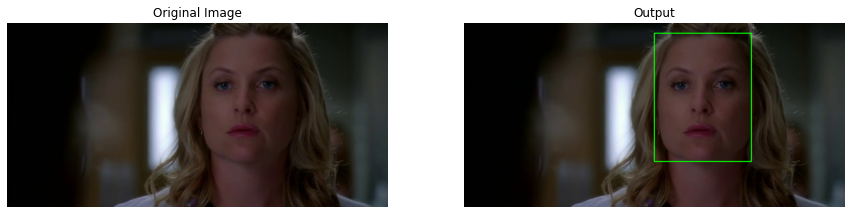

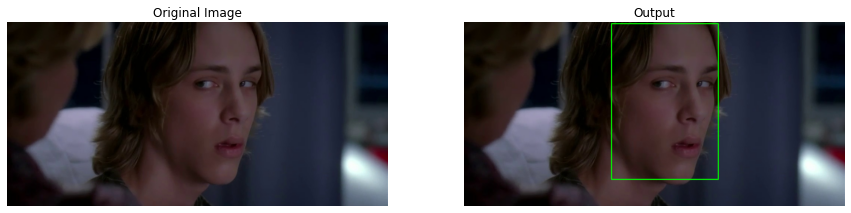

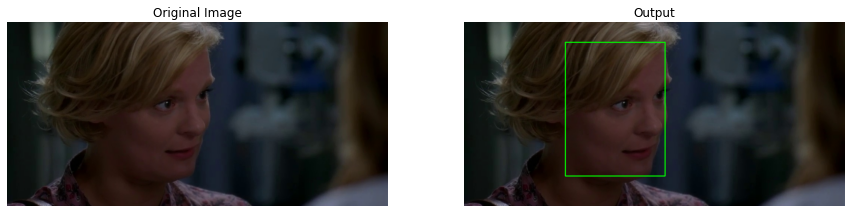

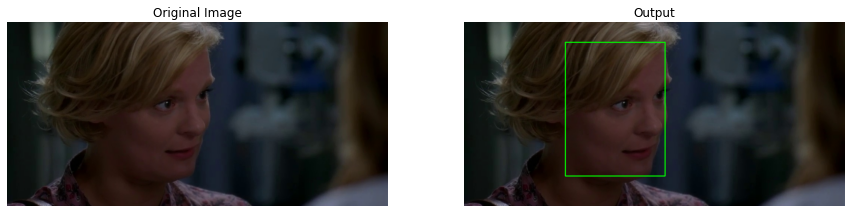

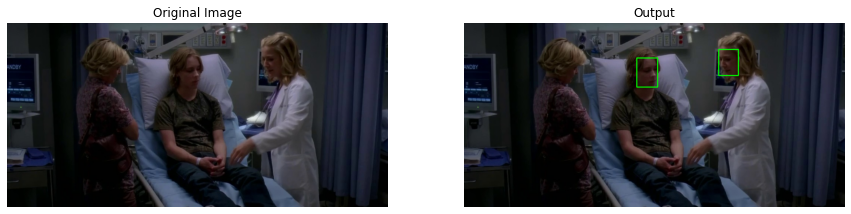

...

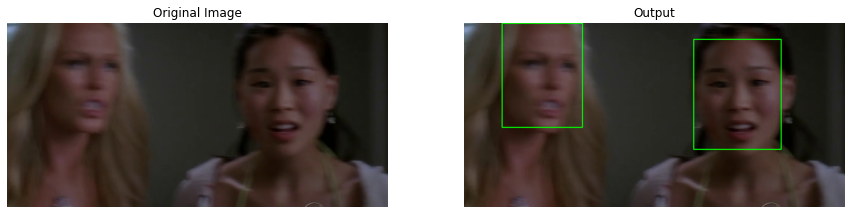

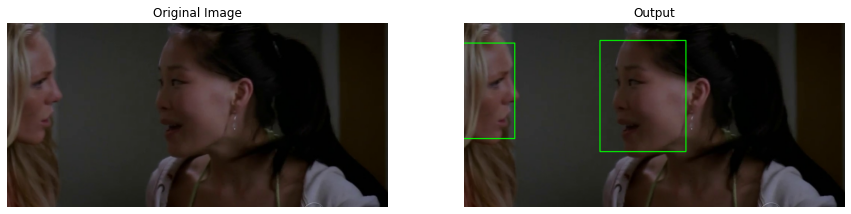

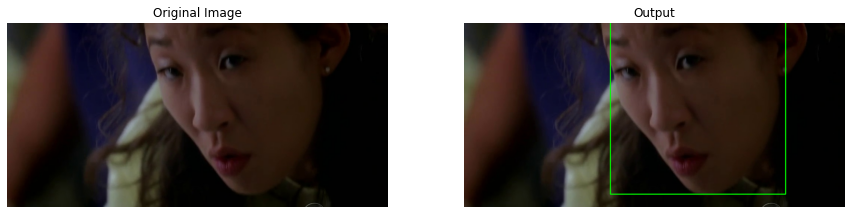

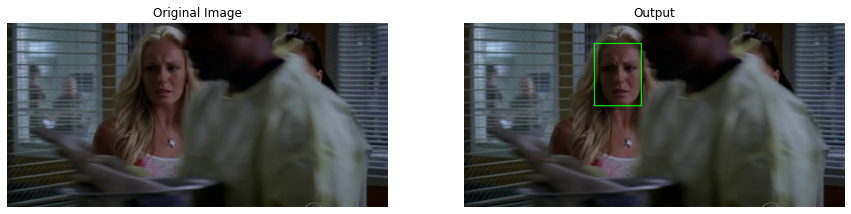

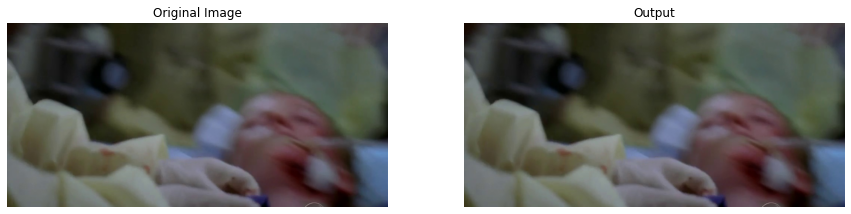

In [ ]:
# Test 20 dev images with FaceNet model
for i in range(20):
    image = dev[i][0]
    height = np.shape(image)[0]
    width = np.shape(image)[0]
    faceDetector(image, width=width, display=True)

## Step 1_1_2 : CNN Model

In [ ]:
# Save face images in drive 

# No need to run!!


def extract_faces(loader, loader_type, width, height, channel):
    # This directory is the path which face images will be saved
    directory = '/content/drive/MyDrive/DP_Phase1/Deep_faces'
    y_list = []
    image_index = 0
    images = os.path.join(directory, loader_type, "images")
    pathlib.Path(images).mkdir(parents=True, exist_ok=True) 
    labels = os.path.join(directory, loader_type, "labels")
    pathlib.Path(labels).mkdir(parents=True, exist_ok=True) 
    for i in range(len(loader)):
        image = loader[i][0]
        face_image, boxes = faceDetector(image, width=width, display=False)
        if type(boxes)== np.ndarray:
            for box in boxes:
                image_index +=1
                x1, y1 = max(int(box[0]),0), max(int(box[1]),0)
                x2, y2 = max(int(box[2]),0), max(int(box[3]),0)
                crop_image = face_image[y1:y2, x1:x2]
                crop_image = cv2.resize(crop_image, (width, height))
                x_index = f'{image_index}.jpg'
                cv2.imwrite(os.path.join(images, x_index ), crop_image)
                y_list.append(loader[i][2])
    y = np.asarray(y_list)
    np.save(os.path.join(labels, "labels.npy"), y)

In [ ]:
# Train arrays

# No need to run!!

# It takes about 60 minutes

width, height, channel = 64,64,3

extract_faces(train, 'train',  width, height, channel)



In [ ]:
# Dev arrays

# No need to run!!

# It takes about 20 minutes
extract_faces(dev, 'dev', width, height, channel)


In [ ]:
# Test arrays

# No need to run!!

# It takes about 20 minutes
extract_faces(test, 'test', width, height, channel)


In [ ]:
# Just run this section, with link below you can load face images from drive directory to collab directory
# If you have problem with this link, you can run 4 sections above and saved these images with arbitary directory

!unzip -q "/content/drive/MyDrive/DP_Phase1.zip" -d "/content"

In [ ]:
# New custom dataloader to load face images

class Face_dataset(torch.utils.data.Dataset):
  def __init__(self, images_directory, labels_directory):
    self.images = images_directory
    self.labels = np.load(labels_directory)
    self.transform = transforms.Compose([transforms.ToTensor()])
    print(len(os.listdir(images_directory)))
  def __len__(self):
    return (np.shape(self.labels)[0])
  def __getitem__(self, idx):
    image = f"{idx+1}.jpg"
    X = cv2.imread(os.path.join(self.images, image))
    X = self.transform(X)
    y = int(self.labels[idx])
    return X,y 


In [ ]:
# The DP_Phase1 directory was created at collab directory

train_faces = Face_dataset('/content/DP_Phase1/Deep_faces/train/images'
                    ,'/content/DP_Phase1/Deep_faces/train/labels/labels.npy')

dev_faces = Face_dataset('/content/DP_Phase1/Deep_faces/dev/images'
                    ,'/content/DP_Phase1/Deep_faces/dev/labels/labels.npy')

test_faces = Face_dataset('/content/DP_Phase1/Deep_faces/test/images'
                    ,'/content/DP_Phase1/Deep_faces/test/labels/labels.npy')




print(f"Length of train dataset is : {len(train_faces)}")
print(f"Length of dev dataset is : {len(dev_faces)}")
print(f"Length of test dataset is : {len(test_faces)}")


31213
7359
7786
Length of train dataset is : 31213
Length of dev dataset is : 7359
Length of test dataset is : 7786


torch.Size([3, 64, 64])
0


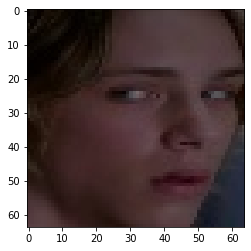

In [ ]:
# Show on image from dev faces
plt.imshow(dev_faces[1][0].permute(1,2,0))
print(np.shape(dev_faces[1][0]))
print(dev_faces[1][1])



In [ ]:
# load dataloaders for face datasets



params = {'batch_size': 16,
          'shuffle': True,
          'num_workers': 6}




face_train_generator = DataLoader(train_faces, **params)
face_dev_generator = DataLoader(dev_faces, **params)
face_test_generator = DataLoader(test_faces, **params)

face_dataloaders = {'train': face_train_generator, 'dev': face_dev_generator, 'test': face_test_generator}

face_dataset_sizes = {'train': len(train_faces), 'dev' : len(dev_faces), 'test' : len(test_faces)}

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:

# train procedure for face images
def train_model2(model, criterion, optimizer, scheduler, num_epochs=25, dataloaders = None, dataset_sizes = None, model_path = None):
    print_every = 10
    valid_loss_min = np.Inf
    val_loss = []
    val_acc = []
    train_loss = []
    train_acc = []
    total_step = len(dataloaders['train'])
    for epoch in range(1, num_epochs+1):
        running_loss = 0.0
        correct = 0
        total=0
        print(f'Epoch {epoch}\n')
        for batch_idx, (data_, target_) in enumerate(dataloaders['train']):
            data_, target_ = data_.to(device), target_.to(device)
            optimizer.zero_grad()
            
            outputs = model(data_)
            loss = criterion(outputs, target_)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            exact,pred = torch.max(outputs, dim=1)
            correct += torch.sum(pred==target_).item()
            total += target_.size(0)
        print('after training...')
        train_acc.append(100 * correct / total)
        train_loss.append(running_loss/total_step)
        print('start priniting train....')
        print(f'\ntrain-loss: {np.mean(train_loss):.4f}, train-acc: {(100 * correct/total):.4f}')
        batch_loss = 0
        total_t=0
        correct_t=0
        print('start val')
        with torch.no_grad():
            model.eval()
            for data_t, target_t in (dataloaders['dev']):
                data_t, target_t = data_t.to(device), target_t.to(device)
                outputs_t = model(data_t)
                loss_t = criterion(outputs_t, target_t)
                batch_loss += loss_t.item()
                _,pred_t = torch.max(outputs_t, dim=1)
                correct_t += torch.sum(pred_t==target_t).item()
                total_t += target_t.size(0)
            val_acc.append(100 * correct_t/total_t)
            val_loss.append(batch_loss/len(dataloaders['dev']))
            network_learned = batch_loss < valid_loss_min
            print(f'validation loss: {np.mean(val_loss):.4f}, validation acc: {(100 * correct_t/total_t):.4f}\n')
            if network_learned:
                valid_loss_min = batch_loss
                torch.save(model, model_path)
                print('Improvement-Detected, save-model')
        model.train()
    return model   

In [ ]:
# test procedure for face images
def test_model(model, dataloaders):
  batch_loss = 0
  total_t=0
  correct_t=0
  with torch.no_grad():
      model.eval()
      for data_t, target_t in (dataloaders['test']):
          data_t, target_t = data_t.to(device), target_t.to(device)
          outputs_t = model(data_t)
          loss_t = criterion(outputs_t, target_t)
          batch_loss += loss_t.item()
          _ ,pred_t = torch.max(outputs_t, dim=1)
          correct_t += torch.sum(pred_t==target_t).item()
          total_t += target_t.size(0)
      test_loss = batch_loss/len(dataloaders['test'])
      print(f'test loss: {np.mean(test_loss):.4f}, test acc: {(100 * correct_t/total_t):.4f}\n')

**The class of the model should run to load the weights**

In [ ]:
# Creating a CNN class
import torch.nn.functional as F
class ConvNeuralNet(nn.Module):
	#  Determine what layers and their order in CNN object 
    def __init__(self, num_classes):
        super(ConvNeuralNet, self).__init__()
        self.conv_layer1 = nn.Conv2d(in_channels=3, out_channels=8, kernel_size=3,padding='same')
        self.max_pool1 = nn.MaxPool2d(kernel_size = 4, stride = 4)
        
        self.conv_layer3 = nn.Conv2d(in_channels=8, out_channels=8, kernel_size=3,padding='same')
        self.max_pool2 = nn.MaxPool2d(kernel_size = 4, stride = 4)

        self.conv_layer5 = nn.Conv2d(in_channels=8, out_channels=8, kernel_size=3,padding='same')
        self.max_pool3 = nn.MaxPool2d(kernel_size = 4, stride = 4)

        self.relu1 = nn.ReLU()
        self.fc2 = nn.Linear(8, num_classes)
        self.softmax = nn.Softmax(dim=1)
    
    # Progresses data across layers    
    def forward(self, x):
        out = self.conv_layer1(x)
        out = self.relu1(out)
        out = self.max_pool1(out)
        
        out = self.conv_layer3(out)
        out = self.relu1(out)
        out = self.max_pool2(out)

        out = self.conv_layer5(out)
        out = self.max_pool3(out)

        out = out.reshape(out.size(0), -1)
        out = self.fc2(out)
        out = self.softmax(out)
        return out

In [ ]:

num_classes = 3
model = ConvNeuralNet(num_classes)

model_face = model.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft = optim.Adam(model_face.parameters(), lr=0.0005)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)


In [ ]:
# Summary of model
summary(model_face, (3,64,64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 8, 64, 64]             224
              ReLU-2            [-1, 8, 64, 64]               0
         MaxPool2d-3            [-1, 8, 16, 16]               0
            Conv2d-4            [-1, 8, 16, 16]             584
              ReLU-5            [-1, 8, 16, 16]               0
         MaxPool2d-6              [-1, 8, 4, 4]               0
            Conv2d-7              [-1, 8, 4, 4]             584
         MaxPool2d-8              [-1, 8, 1, 1]               0
            Linear-9                    [-1, 3]              27
          Softmax-10                    [-1, 3]               0
Total params: 1,419
Trainable params: 1,419
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.05
Forward/backward pass size (MB): 0.55
Params size (MB): 0.01
Estimated Total

In [ ]:
# Train the model
!mkdir '/content/drive/MyDrive/DL_Phase1_models/'
model_face = train_model2(model_face, criterion, optimizer_ft, exp_lr_scheduler, 
                          num_epochs=15, dataloaders = face_dataloaders, dataset_sizes = face_dataset_sizes,
                          model_path = '/content/drive/MyDrive/DL_Phase1_models/face.pt') ##### ----> model_path = the directory for saving the best model based on loss value


Epoch 1



/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


after training...
start priniting train....

train-loss: 1.0913, train-acc: 37.7471
start val
validation loss: 1.0883, validation acc: 37.4915

Improvement-Detected, save-model
Epoch 2

after training...
start priniting train....

train-loss: 1.0910, train-acc: 37.5997
start val
validation loss: 1.0891, validation acc: 37.3692

Epoch 3

after training...
start priniting train....

train-loss: 1.0908, train-acc: 38.0867
start val
validation loss: 1.0897, validation acc: 36.9072

Epoch 4

after training...
start priniting train....

train-loss: 1.0906, train-acc: 38.3110
start val
validation loss: 1.0895, validation acc: 37.8176

Epoch 5

after training...
start priniting train....

train-loss: 1.0904, train-acc: 38.2437
start val
validation loss: 1.0898, validation acc: 38.1438

Epoch 6

after training...
start priniting train....

train-loss: 1.0901, train-acc: 38.4007
start val
validation loss: 1.0899, validation acc: 37.9943

Epoch 7

after training...
start priniting train....

trai

 **Test accuracy by selecting best model in step 1_1_2 is : 35.551**

In [ ]:
# Test the model
model_path = '/content/drive/MyDrive/DL_Phase1_models/face.pt'
best_model = torch.load(model_path)
predicted_tensors = test_model(best_model, face_dataloaders)


test loss: 1.1138, test acc: 32.1089



## Step 1_1_3 : 

In [ ]:
# Save Faces based on main input pictures for train, dev and test set
# Saved directory scheme =====>  ..../image1_face1.jpg,    ...../image1_face2.jpg ,........

# No need to run!!
def extract_faces_byIndex(loader, loader_type, width, height, channel):
    directory = '/content/drive/MyDrive/DP_Phase1_1/ImageWithFace'
    images = os.path.join(directory, loader_type, "images")
    pathlib.Path(images).mkdir(parents=True, exist_ok=True) 
    for i in range(len(loader)):
        image_index = 0
        image = loader[i][0]
        face_image, boxes = faceDetector(image, width=width, display=False)
        if type(boxes)== np.ndarray:
            for box in boxes:
                x1, y1 = max(int(box[0]),0), max(int(box[1]),0)
                x2, y2 = max(int(box[2]),0), max(int(box[3]),0)
                crop_image = face_image[y1:y2, x1:x2]
                crop_image = cv2.resize(crop_image, (width, height))
                x_index = f'{i}_{image_index}.jpg'
                cv2.imwrite(os.path.join(images, x_index ), crop_image)
                image_index +=1     

In [ ]:
width, height, channel = 64,64,3

# No need to run!!

# It takes about 60 minutes
extract_faces_byIndex(train, 'train',  width, height, channel)

In [ ]:
# No need to run!!

# It takes about 20 minutes
extract_faces_byIndex(dev, 'dev', width, height, channel)

In [ ]:
# No need to run!!

# It takes about 20 minutes
extract_faces_byIndex(test, 'test', width, height, channel)

In [ ]:
# We share this link which contains all face images with index of main image
# If you have problem with this link, you can run 4 sections above and saved these images with arbitary directory

!unzip -q "/content/drive/MyDrive/DP_Phase1_1.zip" -d "/content"

In [ ]:
# New custom dataloader to load images
# First : load images which each image has some faces
# Second : apply model on faces and return labels
# Third : design procedure to return correct label

class FaceWithImage_dataset(torch.utils.data.Dataset):
  def __init__(self, loader, model,  images_directory, width, height):
    self.loader = loader
    self.images = images_directory
    self.model = model
    self.width = width
    self.height = height
    self.transform = transforms.Compose([transforms.ToTensor()])
  def __len__(self):
    return (len(self.loader))
  def __getitem__(self, idx):
    flag_index = 0
    image_labels = []
    if (os.path.exists(os.path.join(self.images, f'{idx}_{flag_index}.jpg'))):
      while(os.path.exists(os.path.join(self.images, f'{idx}_{flag_index}.jpg'))):
        face = cv2.imread(os.path.join(self.images, f'{idx}_{flag_index}.jpg'))
        face = self.transform(face)
        face = face.to(device)
        self.model.eval()
        label = self.model(torch.unsqueeze(face,0))
        label = torch.argmax(label)
        image_labels.append(label)
        flag_index+=1
    if len(image_labels) == 0:
      # Choose random label based on histogram
      # 7 : class{0}   ,   8 : class{1}    ,   6 : class{2}
      y = random.choices([0,1,2], weights=(7, 8, 6), k=1)[0]
    elif len(image_labels) == 1:
        y = int(image_labels[0])

    else:
        # Randomly select label based on probability of each one
        y = int(random.choice(image_labels))
    return y, int(self.loader[idx][2])


In [ ]:
# Load the basic dataloader which we created for basic dataset

train = MSCTDDataset('path_to_dataset_train', target_transform = False)
test = MSCTDDataset('path_to_dataset_test', target_transform = False)
dev = MSCTDDataset('path_to_dataset_dev', target_transform = False)

print()

# Then use last datasets to create new datasets containing image with face label
width, height = 64, 64

# load model from step1_2


model_face = torch.load('/content/drive/MyDrive/DL_Phase1_models/face.pt' ,map_location=device)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

train_ImageWithFace = FaceWithImage_dataset(train, model = model_face, 
                                            images_directory = '/content/DP_Phase1_1/DP_Phase1_1/ImageWithFace/train/images', width=width, height=height)
                    
dev_ImageWithFace = FaceWithImage_dataset(dev, model = model_face, 
                                          images_directory = '/content/DP_Phase1_1/DP_Phase1_1/ImageWithFace/dev/images', width=width, height=height)

test_ImageWithFace = FaceWithImage_dataset(test, model = model_face, 
                                           images_directory = '/content/DP_Phase1_1/DP_Phase1_1/ImageWithFace/test/images', width=width, height=height)


print(f"Length of train_ImageWithFace set for step 1_3 is : {len(train_ImageWithFace)}")
print(f"Length of dev_ImageWithFace set for step 1_3 is : {len(dev_ImageWithFace)}")
print(f"Length of test_ImageWithFace set for step 1_3 is : {len(test_ImageWithFace)}")



params = {'batch_size': 16,
          'shuffle': True,
          'num_workers': 0}

ImageWithFace_train_generator = DataLoader(train_ImageWithFace, **params)
ImageWithFace_dev_generator = DataLoader(dev_ImageWithFace, **params)
ImageWithFace_test_generator = DataLoader(test_ImageWithFace, **params)

dataloaders_ImageWithFace = {'train': ImageWithFace_train_generator, 'dev': ImageWithFace_dev_generator, 'test': ImageWithFace_test_generator}



train english_text 20240
train sentiment 20240
test english_text 5067
test sentiment 5067
dev english_text 5063
dev sentiment 5063

Length of train_ImageWithFace set for step 1_3 is : 20240
Length of dev_ImageWithFace set for step 1_3 is : 5063
Length of test_ImageWithFace set for step 1_3 is : 5067


In [ ]:
# Evaluate 2 attached models on train, dev and test sets

def evaluate_model(dataloaders, LoaderType):
    batch_loss = 0
    total_t=0
    correct_t=0
    for pred_t, target_t in (dataloaders[LoaderType]):
        pred_t, target_t = pred_t.to(device), target_t.to(device)
        correct_t += torch.sum(pred_t==target_t).item()
        total_t += target_t.size(0)
    test_loss = batch_loss/len(dataloaders[LoaderType])
    print(f'{LoaderType} accuracy: {(100 * correct_t/total_t):.4f}\n')





**test accuracy in step 1_1_3  is : 39.5500 (best one)**

In [ ]:
# Results of 2 attached models on train. dev and test sets

evaluate_model(dataloaders = dataloaders_ImageWithFace, LoaderType = 'train')
evaluate_model(dataloaders = dataloaders_ImageWithFace, LoaderType = 'dev')
evaluate_model(dataloaders = dataloaders_ImageWithFace, LoaderType = 'test')



train accuracy: 37.7026

dev accuracy: 35.2163

test accuracy: 34.8924



# Step 1_2

## Step1_2_1

In [ ]:
!pip install opencv-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
class Aug_faces_dataset(torch.utils.data.Dataset):
  def __init__(self, images_directory, labels_directory, transform):
    self.image_path = images_directory
    self.labels = np.load(labels_directory)
    self.transform = transform

    Images = os.listdir(self.image_path)
    Images.sort(key = lambda x:  int(x.split(".")[0]))
    self.Images = Images
  def __len__(self):
    return (len(self.labels))
  def __getitem__(self, idx):
    img_path = os.path.join(self.image_path, self.Images[idx])
    img = cv2.imread(img_path)
    img = self.transform(img)
    return img, int(self.labels[idx])

In [ ]:
# original images
transforms = [T.ToTensor()]
transform = T.Compose(transforms)

dev_orig = Aug_faces_dataset("/content/DP_Phase1/Deep_faces/dev/images", 
                        "/content/DP_Phase1/Deep_faces/dev/labels/labels.npy", 
                        transform=transform)

train_orig = Aug_faces_dataset("/content/DP_Phase1/Deep_faces/train/images", 
                        "/content/DP_Phase1/Deep_faces/train/labels/labels.npy", 
                        transform=transform)

test_orig = Aug_faces_dataset("/content/DP_Phase1/Deep_faces/test/images", 
                        "/content/DP_Phase1/Deep_faces/test/labels/labels.npy", 
                        transform=transform)

In [ ]:
# brightness changed images
transforms = [T.ToTensor(), T.ColorJitter(brightness=0.4,contrast=0.4, saturation=0.2, hue=0.1)]
transform = T.Compose(transforms)

dev_color_jitter = Aug_faces_dataset("/content/DP_Phase1/Deep_faces/dev/images", 
                        "/content/DP_Phase1/Deep_faces/dev/labels/labels.npy", 
                        transform=transform)

train_color_jitter = Aug_faces_dataset("/content/DP_Phase1/Deep_faces/train/images", 
                        "/content/DP_Phase1/Deep_faces/train/labels/labels.npy", 
                        transform=transform)

test_color_jitter = Aug_faces_dataset("/content/DP_Phase1/Deep_faces/test/images", 
                        "/content/DP_Phase1/Deep_faces/test/labels/labels.npy", 
                        transform=transform)

In [ ]:
# position changed images
transforms = [T.ToTensor(), T.RandomAffine(degrees=(-120, 120), translate=(0.2, 0.2), scale=(0.7, 1.3))]
transform = T.Compose(transforms)

dev_position = Aug_faces_dataset("/content/DP_Phase1/Deep_faces/dev/images", 
                        "/content/DP_Phase1/Deep_faces/dev/labels/labels.npy", 
                        transform=transform)

train_position = Aug_faces_dataset("/content/DP_Phase1/Deep_faces/train/images", 
                        "/content/DP_Phase1/Deep_faces/train/labels/labels.npy", 
                        transform=transform)

test_position = Aug_faces_dataset("/content/DP_Phase1/Deep_faces/test/images", 
                        "/content/DP_Phase1/Deep_faces/test/labels/labels.npy", 
                        transform=transform)

In [ ]:
# frequency changed images
transforms = [T.ToTensor(), T.GaussianBlur(kernel_size=(5, 5), sigma=(0.2, 2))]
transform = T.Compose(transforms)

dev_freq = Aug_faces_dataset("/content/DP_Phase1/Deep_faces/dev/images", 
                        "/content/DP_Phase1/Deep_faces/dev/labels/labels.npy", 
                        transform=transform)

train_freq = Aug_faces_dataset("/content/DP_Phase1/Deep_faces/train/images", 
                        "/content/DP_Phase1/Deep_faces/train/labels/labels.npy", 
                        transform=transform)

test_freq = Aug_faces_dataset("/content/DP_Phase1/Deep_faces/test/images", 
                        "/content/DP_Phase1/Deep_faces/test/labels/labels.npy", 
                        transform=transform)

In [ ]:
# mixed changed images
transforms = [T.ToTensor(),
              T.ColorJitter(brightness=0.4,contrast=0.4, saturation=0.2, hue=0.1),
              T.RandomAffine(degrees=(-120, 120), translate=(0.2, 0.2), scale=(0.7, 1.3)),
              T.GaussianBlur(kernel_size=(3, 3), sigma=(0.1, 2))]
transform = T.Compose(transforms)

dev_mix = Aug_faces_dataset("/content/DP_Phase1/Deep_faces/dev/images", 
                        "/content/DP_Phase1/Deep_faces/dev/labels/labels.npy", 
                        transform=transform)

train_mix = Aug_faces_dataset("/content/DP_Phase1/Deep_faces/train/images", 
                        "/content/DP_Phase1/Deep_faces/train/labels/labels.npy", 
                        transform=transform)

test_mix = Aug_faces_dataset("/content/DP_Phase1/Deep_faces/test/images", 
                        "/content/DP_Phase1/Deep_faces/test/labels/labels.npy", 
                        transform=transform)

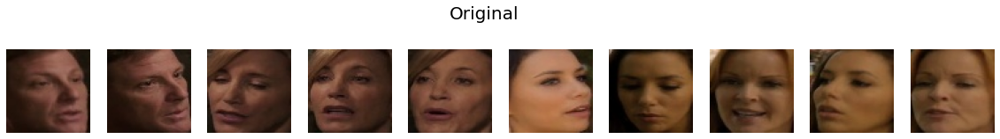

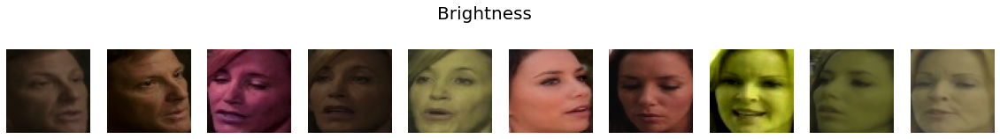

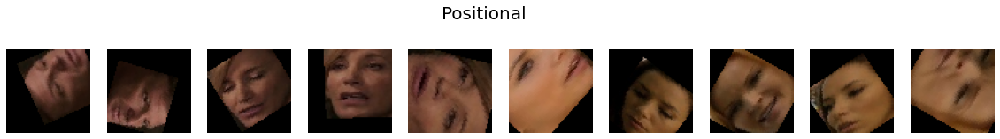

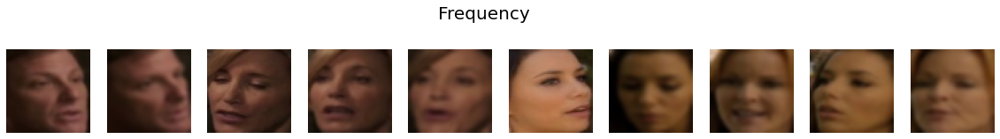

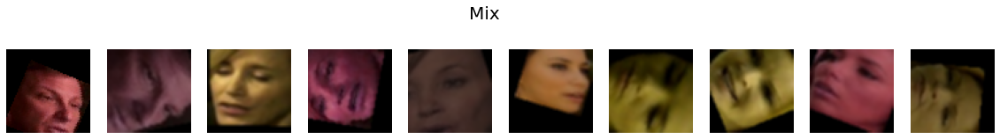

In [ ]:
# original samples
f = plt.figure(figsize=(20,20))
f.suptitle('Original', fontsize=20)
f.subplots_adjust(top=1.7)
for i in range(10):
    image, label = train_orig[i]
    image = image.permute(1,2,0)
    ax = f.add_subplot(1,10,i+1)
    plt.imshow(image)
    plt.axis('off')

# brightness samples
f = plt.figure(figsize=(20,20))
f.suptitle('Brightness', fontsize=20)
f.subplots_adjust(top=1.7)
for i in range(10):
    image, label = train_color_jitter[i]
    image = image.permute(1,2,0)
    ax = f.add_subplot(1,10,i+1)
    plt.imshow(image)
    plt.axis('off')

# position samples
f = plt.figure(figsize=(20,20))
f.suptitle('Positional', fontsize=20)
f.subplots_adjust(top=1.7)
for i in range(10):
    image, label = train_position[i]
    image = image.permute(1,2,0)
    ax = f.add_subplot(1,10,i+1)
    plt.imshow(image)
    plt.axis('off')

# frequency samples
f = plt.figure(figsize=(20,20))
f.suptitle('Frequency', fontsize=20)
f.subplots_adjust(top=1.7)
for i in range(10):
    image, label = train_freq[i]
    image = image.permute(1,2,0)
    ax = f.add_subplot(1,10,i+1)
    plt.imshow(image)
    plt.axis('off')

# Mixed samples
f = plt.figure(figsize=(20,20))
f.suptitle('Mix', fontsize=20)
f.subplots_adjust(top=1.7)
for i in range(10):
    image, label = train_mix[i]
    image = image.permute(1,2,0)
    ax = f.add_subplot(1,10,i+1)
    plt.imshow(image)
    plt.axis('off')

In [ ]:
# load saved model from last section
criterion = nn.CrossEntropyLoss()
num_classes = 3
model = ConvNeuralNet(num_classes)
model_path = '/content/drive/MyDrive/face.pt'
model = torch.load(model_path)
model.to(device)


ConvNeuralNet(
  (conv_layer1): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (max_pool1): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (conv_layer3): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (max_pool2): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (conv_layer5): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (max_pool3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (relu1): ReLU()
  (fc2): Linear(in_features=8, out_features=3, bias=True)
  (softmax): Softmax(dim=1)
)

In [ ]:
params = {'batch_size': 16,
          'shuffle': True,
          'num_workers': 6}
          
train_orig_generator = DataLoader(train_orig, **params)
dev_orig_generator = DataLoader(dev_orig, **params)
test_orig_generator = DataLoader(test_orig, **params)
dataloaders_orig = {'train': train_orig_generator, 'dev': dev_orig_generator, 'test': test_orig_generator}

train_color_jitter_generator = DataLoader(train_color_jitter, **params)
dev_color_jitter_generator = DataLoader(dev_color_jitter, **params)
test_color_jitter_generator = DataLoader(test_color_jitter, **params)
dataloaders_color_jitter = {'train': train_color_jitter_generator, 'dev': dev_color_jitter_generator, 'test': test_color_jitter_generator}
dataloaders_color_jitter_sizes = {'train': len(train_color_jitter), 'dev' : len(dev_color_jitter), 'test' : len(test_color_jitter)}

train_position_generator = DataLoader(train_position, **params)
dev_position_generator = DataLoader(dev_position, **params)
test_position_generator = DataLoader(test_position, **params)
dataloaders_position = {'train': train_position_generator, 'dev': dev_position_generator, 'test': test_orig_generator}
dataloaders_position_sizes = {'train': len(train_position), 'dev' : len(dev_position), 'test' : len(test_position)}

train_freq_generator = DataLoader(train_freq, **params)
dev_freq_generator = DataLoader(dev_freq, **params)
test_freq_generator = DataLoader(test_freq, **params)
dataloaders_freq = {'train': train_freq_generator, 'dev': dev_freq_generator, 'test': test_freq_generator}
dataloaders_freq_sizes = {'train': len(train_freq), 'dev' : len(dev_freq), 'test' : len(test_freq)}

train_mix_generator = DataLoader(train_mix, **params)
dev_mix_generator = DataLoader(dev_mix, **params)
test_mix_generator = DataLoader(test_mix, **params)
dataloaders_mix = {'train': train_mix_generator, 'dev': dev_mix_generator, 'test': test_mix_generator}
dataloaders_mix_sizes = {'train': len(train_mix), 'dev' : len(dev_mix), 'test' : len(test_mix)}

In [ ]:
print("Evaluation for original dataset:")
test_model(model, dataloaders_orig)

print("Evaluation for color jittered dataset:")
test_model(model, dataloaders_color_jitter)

print("Evaluation for position changed dataset:")
test_model(model, dataloaders_position)

print("Evaluation for frequency changed dataset:")
test_model(model, dataloaders_freq)

print("Evaluation for mixed transforms dataset:")
test_model(model, dataloaders_mix)

Evaluation for original dataset:
test loss: 1.1064, test acc: 37.9014

Evaluation for color jittered dataset:
test loss: 1.1069, test acc: 36.8482

Evaluation for position changed dataset:
test loss: 1.1064, test acc: 37.9014

Evaluation for frequency changed dataset:
test loss: 1.1066, test acc: 37.4133

Evaluation for mixed transforms dataset:
test loss: 1.1062, test acc: 38.9288



In [ ]:
train_orig_color_jitter_generator = DataLoader(ConcatDataset([train_orig, train_color_jitter]), **params)
dev_orig_color_jitter_generator = DataLoader(ConcatDataset([dev_orig, dev_color_jitter]), **params)
test_orig_color_jitter_generator = DataLoader(ConcatDataset([test_orig, test_color_jitter]), **params)
dataloaders_orig_color_jitter = {'train': train_orig_color_jitter_generator, 
                                 'dev': dev_orig_color_jitter_generator, 
                                 'test': test_orig_color_jitter_generator}
orig_color_jitter_sizes = {'train': (len(train_orig)+len(train_color_jitter)), 
                           'dev' : (len(dev_orig)+len(dev_color_jitter)), 
                           'test' : (len(test_orig)+len(test_color_jitter))}

train_orig_position_generator = DataLoader(ConcatDataset([train_orig, train_position]), **params)
dev_orig_position_generator = DataLoader(ConcatDataset([dev_orig, dev_position]), **params)
test_orig_position_generator = DataLoader(ConcatDataset([test_orig, test_position]), **params)
dataloaders_orig_position = {'train': train_orig_position_generator, 
                                 'dev': dev_orig_position_generator, 
                                 'test': test_orig_position_generator}
orig_position_sizes = {'train': (len(train_orig)+len(train_position)), 
                           'dev' : (len(dev_orig)+len(dev_position)), 
                           'test' : (len(test_orig)+len(test_position))}

train_orig_freq_generator = DataLoader(ConcatDataset([train_orig, train_freq]), **params)
dev_orig_freq_generator = DataLoader(ConcatDataset([dev_orig, dev_freq]), **params)
test_orig_freq_generator = DataLoader(ConcatDataset([test_orig, test_freq]), **params)
dataloaders_orig_freq = {'train': train_orig_freq_generator, 
                                 'dev': dev_orig_freq_generator, 
                                 'test': test_orig_freq_generator}
orig_freq_sizes = {'train': (len(train_orig)+len(train_freq)), 
                           'dev' : (len(dev_orig)+len(dev_freq)), 
                           'test' : (len(test_orig)+len(test_freq))}

train_orig_mix_generator = DataLoader(ConcatDataset([train_orig, train_mix]), **params)
dev_orig_mix_generator = DataLoader(ConcatDataset([dev_orig, dev_mix]), **params)
test_orig_mix_generator = DataLoader(ConcatDataset([test_orig, test_mix]), **params)
dataloaders_orig_mix = {'train': train_orig_mix_generator, 
                                 'dev': dev_orig_mix_generator, 
                                 'test': test_orig_mix_generator}
orig_mix_sizes = {'train': (len(train_orig)+len(train_mix)), 
                           'dev' : (len(dev_orig)+len(dev_mix)), 
                           'test' : (len(test_orig)+len(test_mix))}

In [ ]:
num_classes = 3
criterion = nn.CrossEntropyLoss()

In [ ]:
print("Training for color jittered dataset:")
model = ConvNeuralNet(num_classes)
model_orig_color_jitter = model.to(device)
optimizer_orig_color_jitter = optim.Adam(model_orig_color_jitter.parameters(), lr=0.0005)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_orig_color_jitter, step_size=7, gamma=0.1)
model_orig_color_jitter = train_model2(model_orig_color_jitter, criterion, optimizer_orig_color_jitter, exp_lr_scheduler, 
                          num_epochs=15, dataloaders = dataloaders_orig_color_jitter, dataset_sizes = orig_color_jitter_sizes,
                          model_path = '/content/face.pt')

Training for color jittered dataset:
Epoch 1

after training...
start priniting train....

train-loss: 1.0921, train-acc: 37.2537
start val
validation loss: 1.0885, validation acc: 37.4779

Improvement-Detected, save-model
Epoch 2

after training...
start priniting train....

train-loss: 1.0915, train-acc: 37.8512
start val
validation loss: 1.0893, validation acc: 36.3433

Epoch 3

after training...
start priniting train....

train-loss: 1.0911, train-acc: 38.0322
start val
validation loss: 1.0896, validation acc: 36.0511

Epoch 4

after training...
start priniting train....

train-loss: 1.0907, train-acc: 38.1940
start val
validation loss: 1.0901, validation acc: 36.0715

Epoch 5

after training...
start priniting train....

train-loss: 1.0904, train-acc: 38.2309
start val
validation loss: 1.0902, validation acc: 36.3908

Epoch 6

after training...
start priniting train....

train-loss: 1.0901, train-acc: 38.2581
start val
validation loss: 1.0906, validation acc: 36.2889

Epoch 7

val

In [ ]:
print("Training for position changed dataset:")
model = ConvNeuralNet(num_classes)
model_orig_position = model.to(device)
optimizer_orig_position = optim.Adam(model_orig_position.parameters(), lr=0.0005)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_orig_position, step_size=7, gamma=0.1)
model_orig_position = train_model2(model_orig_position, criterion, optimizer_orig_position, exp_lr_scheduler, 
                          num_epochs=15, dataloaders = dataloaders_orig_position, dataset_sizes = orig_position_sizes,
                          model_path = '/content/face.pt')

Training for position changed dataset:
Epoch 1

after training...
start priniting train....

train-loss: 1.0920, train-acc: 37.5292
start val
validation loss: 1.0902, validation acc: 35.8065

Improvement-Detected, save-model
Epoch 2

after training...
start priniting train....

train-loss: 1.0915, train-acc: 37.8288
start val
validation loss: 1.0912, validation acc: 35.4940

Epoch 3

after training...
start priniting train....

train-loss: 1.0912, train-acc: 38.0835
start val
validation loss: 1.0911, validation acc: 36.4180

Epoch 4

after training...
start priniting train....

train-loss: 1.0909, train-acc: 38.1428
start val
validation loss: 1.0911, validation acc: 36.5879

Epoch 5

after training...
start priniting train....

train-loss: 1.0907, train-acc: 38.0418
start val
validation loss: 1.0913, validation acc: 35.7453

Epoch 6

after training...
start priniting train....

train-loss: 1.0905, train-acc: 38.0178
start val
validation loss: 1.0916, validation acc: 35.6230

Epoch 7

a

In [ ]:
print("Training for frequency changed dataset:")
model = ConvNeuralNet(num_classes)
model_orig_freq = model.to(device)
optimizer_orig_freq = optim.Adam(model_orig_freq.parameters(), lr=0.0005)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_orig_freq, step_size=7, gamma=0.1)
model_orig_freq = train_model2(model_orig_freq, criterion, optimizer_orig_freq, exp_lr_scheduler, 
                          num_epochs=15, dataloaders = dataloaders_orig_freq, dataset_sizes = orig_freq_sizes,
                          model_path = '/content/face.pt')

Training for frequency changed dataset:
Epoch 1

after training...
start priniting train....

train-loss: 1.0915, train-acc: 37.5661
start val
validation loss: 1.0891, validation acc: 37.0363

Improvement-Detected, save-model
Epoch 2

after training...
start priniting train....

train-loss: 1.0912, train-acc: 37.9121
start val
validation loss: 1.0898, validation acc: 36.5879

Epoch 3

after training...
start priniting train....

train-loss: 1.0910, train-acc: 37.9121
start val
validation loss: 1.0897, validation acc: 37.3216

Epoch 4

after training...
start priniting train....

train-loss: 1.0908, train-acc: 37.8320
start val
validation loss: 1.0897, validation acc: 37.5798

Epoch 5

after training...
start priniting train....

train-loss: 1.0906, train-acc: 38.0499
start val
validation loss: 1.0905, validation acc: 35.6706

Epoch 6

after training...
start priniting train....

train-loss: 1.0904, train-acc: 38.3622
start val
validation loss: 1.0907, validation acc: 36.1666

Epoch 7



In [ ]:
print("Training for mixed transforms dataset:")
model = ConvNeuralNet(num_classes)
model_orig_mix = model.to(device)
optimizer_orig_mix = optim.Adam(model_orig_mix.parameters(), lr=0.0005)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_orig_mix, step_size=7, gamma=0.1)
model_orig_mix = train_model2(model_orig_mix, criterion, optimizer_orig_mix, exp_lr_scheduler, 
                          num_epochs=15, dataloaders = dataloaders_orig_mix, dataset_sizes = orig_mix_sizes,
                          model_path = '/content/face.pt')

Training for mixed transforms dataset:
Epoch 1

after training...
start priniting train....

train-loss: 1.0926, train-acc: 36.9285
start val
validation loss: 1.0891, validation acc: 36.7781

Improvement-Detected, save-model
Epoch 2

after training...
start priniting train....

train-loss: 1.0921, train-acc: 37.5661
start val
validation loss: 1.0895, validation acc: 36.2277

Epoch 3

after training...
start priniting train....

train-loss: 1.0917, train-acc: 37.8688
start val
validation loss: 1.0900, validation acc: 36.5879

Epoch 4

after training...
start priniting train....

train-loss: 1.0914, train-acc: 37.9666
start val
validation loss: 1.0897, validation acc: 36.3093

Improvement-Detected, save-model
Epoch 5

after training...
start priniting train....

train-loss: 1.0912, train-acc: 37.8400
start val
validation loss: 1.0898, validation acc: 36.2413

Epoch 6

after training...
start priniting train....

train-loss: 1.0911, train-acc: 37.8817
start val
validation loss: 1.0900, va

# Step3

In [ ]:
# class of model in part1
import torch.nn.functional as F
class ConvNeuralNet(nn.Module):
	#  Determine what layers and their order in CNN object 
    def __init__(self, num_classes):
        super(ConvNeuralNet, self).__init__()
        self.conv_layer1 = nn.Conv2d(in_channels=3, out_channels=8, kernel_size=3,padding='same')
        self.max_pool1 = nn.MaxPool2d(kernel_size = 4, stride = 4)
        
        self.conv_layer3 = nn.Conv2d(in_channels=8, out_channels=8, kernel_size=3,padding='same')
        self.max_pool2 = nn.MaxPool2d(kernel_size = 4, stride = 4)

        self.conv_layer5 = nn.Conv2d(in_channels=8, out_channels=8, kernel_size=3,padding='same')
        self.max_pool3 = nn.MaxPool2d(kernel_size = 4, stride = 4)

        self.relu1 = nn.ReLU()
        self.fc2 = nn.Linear(8, num_classes)
        self.softmax = nn.Softmax(dim=1)
    
    # Progresses data across layers    
    def forward(self, x):
        out = self.conv_layer1(x)
        out = self.relu1(out)
        out = self.max_pool1(out)
        
        out = self.conv_layer3(out)
        out = self.relu1(out)
        out = self.max_pool2(out)

        out = self.conv_layer5(out)
        out = self.max_pool3(out)

        out = out.reshape(out.size(0), -1)
        out = self.fc2(out)
        out = self.softmax(out)
        return out

In [ ]:
# class of model in part2

from torch.nn.modules.container import Sequential
class NeuralNetwork(nn.Module):
    def __init__(self):
        super(NeuralNetwork, self).__init__()
        vgg16_pretrained = models.vgg16(pretrained=True).to(device)
        self.features = vgg16_pretrained.features
        self.avgpool = nn.AdaptiveAvgPool2d(output_size =(2,2))
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(in_features=2048, out_features=128, bias=True),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5, inplace=False),
            nn.Linear(in_features=128, out_features=16, bias=True),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5, inplace=False),
            nn.Linear(in_features=16, out_features=3, bias=True))

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        y = self.classifier(x)
        return y




In [ ]:
# Again get predicted labels of 2 models in part1 and part2

# Test1 : get labels of model from part1
# Test2 : get labeks of model from part2
# NumberOfFaces : get number of faces in each image based on saved images from part 1_1_3
# concate_output : concatenate outputs to reproduce the inputs of new network
def Test1(model, dataloaders, ImageType):
    batch_loss = 0
    total_t=0
    correct_t=0
    predicted_tensors = torch.tensor([])
    predicted_tensors = predicted_tensors.to(device)
    with torch.no_grad():
        model.eval()
        for data_t, _ , target_t in (dataloaders):
            data_t, target_t = data_t.to(device), target_t.to(device)
            outputs_t = model(data_t)
            predicted_tensors = torch.cat((predicted_tensors, outputs_t),0)
 
    return predicted_tensors

def Test2(dataloader):
  predicted_tensors = torch.tensor([])
  # predicted_tensors = predicted_tensors.to(device)
  for pred_t, _ in (dataloader):
    # pred_t = pred_t.to(device)
    predicted_tensors = torch.cat((predicted_tensors, pred_t),0)
  return predicted_tensors

def NumberOfFaces(dataset, directory):
  faces = []
  for idx in range(len(dataset)):
    d = f'{idx}_*.jpg'
    face_counts = len(glob.glob(os.path.join(directory, d)))
    faces.append(face_counts)
  return torch.tensor(faces)

def concate_output(loader, face_label, image_labels, faceNum):
  face_label = face_label.to(device)
  image_labels = image_labels.to(device)
  faceNum = faceNum.to(device)
  return torch.cat((torch.unsqueeze(face_label,1), image_labels, torch.unsqueeze(faceNum,1)), 1)

In [ ]:
model_step1 = torch.load('/content/drive/MyDrive/DL_Phase1_models/face.pt',map_location=device)
model_step2 = torch.load('/content/drive/MyDrive/DL_Phase1_models/Parvizi_Part2.pt',map_location=device)

train_image = MSCTDDataset('path_to_dataset_train', transform = True)
test_image = MSCTDDataset('path_to_dataset_test', transform = True)
dev_image = MSCTDDataset('path_to_dataset_dev', transform = True)

params = {'batch_size': 64,
          'shuffle': False,
          'num_workers': 6}



train_images_generator = DataLoader(train_image, **params)
dev_images_generator = DataLoader(dev_image, **params)
test_images_generator = DataLoader(test_image, **params)


# Now reproduce new inputs for step3 
# It takes about 1 hours

# We use from ImageWithFace dataloaders from step1_3
train_predicted_face_labels = Test2(dataloaders_ImageWithFace['train'])
train_predicted_image_labels = Test1(model_step2, train_images_generator, 'image')
train_NumberOfFaces = NumberOfFaces(train_image, directory = '/content/DP_Phase1_1/DP_Phase1_1/ImageWithFace/train/images')
train_input = concate_output(train, train_predicted_face_labels, train_predicted_image_labels, train_NumberOfFaces)

dev_predicted_face_labels = Test2(dataloaders_ImageWithFace['dev'])
dev_predicted_image_labels = Test1(model_step2, dev_images_generator, 'image')
dev_NumberOfFaces = NumberOfFaces(dev_image, directory = '/content/DP_Phase1_1/DP_Phase1_1/ImageWithFace/dev/images')
dev_input = concate_output(dev, dev_predicted_face_labels, dev_predicted_image_labels, dev_NumberOfFaces)

test_predicted_face_labels = Test2(dataloaders_ImageWithFace['test'])
test_predicted_image_labels = Test1(model_step2, test_images_generator, 'image')
test_NumberOfFaces = NumberOfFaces(test_image, directory = '/content/DP_Phase1_1/DP_Phase1_1/ImageWithFace/test/images')
test_input = concate_output(test, test_predicted_face_labels, test_predicted_image_labels, test_NumberOfFaces)



train english_text 20240
train sentiment 20240
test english_text 5067
test sentiment 5067
dev english_text 5063
dev sentiment 5063


AttributeError: ignored

In [ ]:
# Save new inputs in collab directory

torch.save(train_input, 'train_input.pt')
torch.save(test_input, 'test_input.pt')
torch.save(dev_input, 'dev_input.pt')

In [ ]:
# New custom dataloader to load last inputs and related label to each input

class final_dataset(torch.utils.data.Dataset):
  def __init__(self, directory, loader):
    self.dir = directory
    self.loader = loader
  def __len__(self):
    return (len(self.loader))
  def __getitem__(self, idx):
    X = torch.load(self.dir, 'cpu')[idx]
    # X = X.to(device)
    return X , self.loader[idx][2]

In [ ]:
# Simple network for part3

class main_NeuralNetwork(nn.Module):
    def __init__(self):
        super(main_NeuralNetwork, self).__init__()
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(in_features=5, out_features=16, bias=True),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5, inplace=False),
            nn.Linear(in_features=16, out_features=8, bias=True),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5, inplace=False),
            nn.Linear(in_features=8, out_features=3, bias=True))

    def forward(self, x):
        y = self.classifier(x)
        return y

In [ ]:
# Train
def train(address, early_stoping, patience, device, model, epochs, optimizer, loss_function, train_loader, valid_loader):
    size = len(train_loader.dataset)
    # Early stopping
    last_loss = 100
    last_acc = 0
    triggertimes = 0

    for epoch in range(1, epochs+1):
        correct = 0
        for times, (X , y) in enumerate(train_loader):
            X = X.to(device)
            y = y.to(device)
            
            # Zero the gradients
            optimizer.zero_grad()

            # Forward and backward propagation
            pred = model(X)
            loss = loss_function(pred, y)
            loss.backward()
            optimizer.step()
            correct += (pred.argmax(1) == y).type(torch.float).sum().item()
            
            # Show progress
            if times % 100 == 0 or times == len(train_loader):
                print('[{}/{}, {}/{}] loss: {:.8}'.format(epoch, epochs, times, len(train_loader), loss.item()))

        # Early stopping
        correct /= size
        current_loss, current_acc = validation(model, device, valid_loader, loss_function)
        print('[{}/{}]'.format(epoch, epochs))
        print('train loss: {:.8}   |||   train accuracy: {:.8}'.format(loss.item(), 100*correct))
        print('  dev loss: {:.8}   |||     dev accuracy: {:.8}'.format(current_loss, current_acc))

        if early_stoping == "loss":
          C = current_loss > last_loss
        elif early_stoping == "accuracy":
          C = current_acc < last_acc
        if C:
            trigger_times += 1
            print('Trigger Times:', trigger_times)
            if trigger_times >= patience:
                print('Early stopping!\nStart to test process.')
                return print(15*"=")
        else:
            torch.save(model, address)
            print('trigger times: 0')
            trigger_times = 0
            if early_stoping == "accuracy":
              last_acc = current_acc
            elif early_stoping == "loss":
              last_loss = current_loss
    best_model = model = torch.load(address)
    return print(15*"=")


def validation(model, device, dataloader, loss_fn):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    test_loss, correct = 0, 0
    with torch.no_grad():
        model.eval()
        for (X, y) in dataloader:
          X = X.to(device)
          y = y.to(device)
          pred = model(X)
          test_loss += loss_fn(pred, y).item()
          correct += (pred.argmax(1) == y).type(torch.float).sum().item()
    test_loss /= num_batches
    correct /= size
    return test_loss, 100*correct

def test(device, model, dataloader, loss_fn):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    test_loss, correct = 0, 0
    with torch.no_grad():
        model.eval()
        for (X, y) in dataloader:
          X = X.to(device)
          y = y.to(device)
          pred = model(X)
          test_loss += loss_fn(pred, y).item()
          correct += (pred.argmax(1) == y).type(torch.float).sum().item()
    test_loss /= num_batches
    correct /= size
    print(f"test Error:  Accuracy: {(100*correct):>0.1f}%, Avg loss: {test_loss:>8f} \n")



In [ ]:
# GPU device
import torch.multiprocessing as mp

device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
print('Device state:', device)



# Save address pass
address = "/content/drive/MyDrive/DL_Phase1_models/final_model"
torch.manual_seed(39)
epochs = 10
batch_size = 16
image_size = (64, 64)
learning_rate = 1e-3
loss_fn = nn.CrossEntropyLoss()
main_model = main_NeuralNetwork().to(device)
    
optimizer = torch.optim.Adam(main_model.parameters(), lr=learning_rate)

# Transform
transform = transforms.Compose([transforms.ToTensor(), transforms.Resize(size = image_size)])


# Dataloaders
train_set = final_dataset('/content/train_input.pt', train_image)
dev_set = final_dataset('/content/dev_input.pt', dev_image)
test_set = final_dataset('/content/test_input.pt', test_image)

params = {'batch_size': 16,
          'shuffle': True,
          'num_workers': 6}

train_dataloader = DataLoader(train_set, **params)
dev_dataloader = DataLoader(dev_set, **params)
test_dataloader = DataLoader(test_set, **params)



# Train
print("\n\nTraining...")

early_stoping = "accuracy"
patience = 1
train(address, early_stoping, patience, device, main_model, epochs, optimizer, loss_fn, train_dataloader, dev_dataloader)
best_model = torch.load(address)

# # Test
test(device, best_model, test_dataloader, loss_fn)


Device state: cuda:0


Training...
[1/10, 0/1265] loss: 1.1569297
[1/10, 100/1265] loss: 1.0686797
[1/10, 200/1265] loss: 1.0973749
[1/10, 300/1265] loss: 1.0891246
[1/10, 400/1265] loss: 1.0977763
[1/10, 500/1265] loss: 1.0955316
[1/10, 600/1265] loss: 1.0533724
[1/10, 700/1265] loss: 1.0370321
[1/10, 800/1265] loss: 1.1327742
[1/10, 900/1265] loss: 1.0795887
[1/10, 1000/1265] loss: 1.1231227
[1/10, 1100/1265] loss: 1.0885582
[1/10, 1200/1265] loss: 1.0742437
[1/10]
train loss: 1.0451711   |||   train accuracy: 38.690711
  dev loss: 1.0960803   |||     dev accuracy: 36.223583
trigger times: 0
[2/10, 0/1265] loss: 1.1018091
[2/10, 100/1265] loss: 1.1285932
[2/10, 200/1265] loss: 1.1203318
[2/10, 300/1265] loss: 1.0829682
[2/10, 400/1265] loss: 1.143039
[2/10, 500/1265] loss: 1.0567588
[2/10, 600/1265] loss: 1.0630971
[2/10, 700/1265] loss: 1.1472034
[2/10, 800/1265] loss: 1.057574
[2/10, 900/1265] loss: 1.0629373
[2/10, 1000/1265] loss: 1.1416959
[2/10, 1100/1265] loss: 1.0465941
[2/10